## Import libraries. Set folder

In [1]:
import sys, os
sys.path.append('../src/')
import load_data, plotting, utils

sys.path.append('../src/models/')
import crop_classifier

from xgboost import XGBClassifier
import pickle
import json

# Data folders
path = '../../Geo_data/'
path_pics = os.path.join(path, 'Crop_Eurasia/Geo_pics', '')
if not os.path.exists(path_pics):
    os.makedirs(path_pics)

c:\Users\Daria\anaconda3\envs\geo\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Elevation data is collected


In [27]:
import importlib
importlib.reload(utils)

<module 'utils' from 'c:\\Users\\Daria\\DT\\Geo\\ArableLand2\\notebooks\\../src\\utils.py'>

## Set the dates. Load data

In [2]:
# Set years (last year will be excluded)
# If stop_year is not defined, start year goes to collection only
year_start_train = 2006
year_stop_train = 2009

year_start_test = 2017
year_start_future = 2025

# Land cover time lag (years)
lag = 1

CMIPs = ['CNRM-CM5', 'GFDL-CM3', 'MPI-ESM-MR']

In [3]:
# Elevation edited 2 years new
Elv = load_data.elevation(path)

# # Land cover historical feature
LC_feature_train = load_data.land_cover(path = path, year_start = year_start_train - 5, year_stop = year_stop_train - 5)
LC_feature_test = load_data.land_cover(path = path, year_start = year_start_test - 5)
LC_feature_future = load_data.land_cover(path = path, year_start = year_start_future - 5)

# # Climate
Climate_train, years_train = load_data.climate(path = path, year_start = year_start_train, year_stop = year_stop_train)
Climate_test, years_test = load_data.climate(path = path, year_start = year_start_test)

# Climate_future = dict.fromkeys(CMIPs)
Climate_future = dict.fromkeys(CMIPs)
for CMIP in CMIPs:
    Climate_future[CMIP], years_future = load_data.climate(path = path, year_start = year_start_future, CMIP = CMIP)

# Land cover target feature
LC_train = load_data.land_cover(path = path, year_start = year_start_train + lag, year_stop = year_stop_train + lag)
LC_test = load_data.land_cover(path = path, year_start = year_start_test + lag)

Elevation data is collected
Land cover dictionary is collected for 3 year(s)
Land cover dictionary is collected for 1 year(s)
Land cover dictionary is collected for 1 year(s)


100%|██████████| 3/3 [01:19<00:00, 26.46s/it]


Output dictionary with climate includes 11 biovariables accumulated for 3 year(s)


100%|██████████| 1/1 [00:25<00:00, 25.91s/it]


Output dictionary with climate includes 11 biovariables accumulated for 1 year(s)


100%|██████████| 1/1 [00:13<00:00, 13.82s/it]


Output dictionary with climate includes 11 biovariables accumulated for 1 year(s)


100%|██████████| 1/1 [00:13<00:00, 13.58s/it]


Output dictionary with climate includes 11 biovariables accumulated for 1 year(s)


100%|██████████| 1/1 [00:13<00:00, 13.61s/it]


Output dictionary with climate includes 11 biovariables accumulated for 1 year(s)
Land cover dictionary is collected for 3 year(s)
Land cover dictionary is collected for 1 year(s)


#### Data analysis

11it [01:39,  9.04s/it]


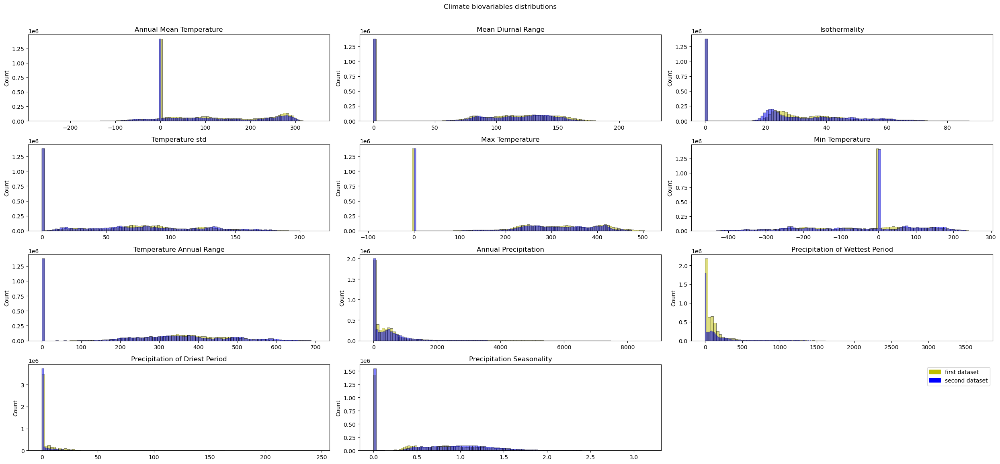

In [91]:
# Plot biovariables distributions for 2 datasets
plotting.plot_biovars_dist(Climate_test, Climate_future['CNRM-CM5'])

0it [00:00, ?it/s]FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
1it [00:00,  3.93it/s]FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
2it [00:00,  4.66it/s]FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
3it [00:00,  5.07it/s]FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
4it [00:00,  5.33it/s]FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
5it [00:00,  5.45it/s]FixedFormatter should only be used together with FixedLocator
FixedFormatter should only be used together with FixedLocator
6it [00:01,  5.24it/s]


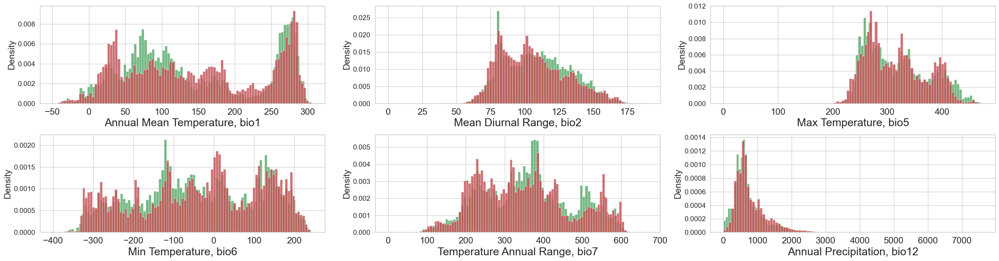

In [176]:
# Plot biovariables distributions only among objects whose class (crop/non-crop) have changed between 2 datasets
plotting.plot_biovars_dist_changed(Climate_train, LC_train, LC_test)

## Model

In [4]:
# Load models if they exist
try: 
    model_climate_loaded = XGBClassifier()
    with open("model_climate.pkl","rb") as fp:
        model_climate_loaded = pickle.load(fp)

    model_climate_lc_loaded = XGBClassifier()
    with open("model_climate_lc.pkl","rb") as fp:
        model_climate_lc_loaded = pickle.load(fp)

except:
    model_climate_loaded = None
    model_climate_lc_loaded = None

________________________________________________
Model with features ['bio12', 'bio1', 'bio5', 'elv']
RA_score = 0.9136707484806799
threshold = 0.26101717
recall_score = 0.735185146659152
precision_score = 0.4496830317893665
balanced_accuracy_score = 0.812657713465919


FixedFormatter should only be used together with FixedLocator


________________________________________________
Model with features ['bio12', 'bio1', 'bio5', 'elv', 'lc']
RA_score = 0.9893481131669386
threshold = 0.64821786
recall_score = 0.9452872189324493
precision_score = 0.9451889001093045
balanced_accuracy_score = 0.9692965873389717


FixedFormatter should only be used together with FixedLocator


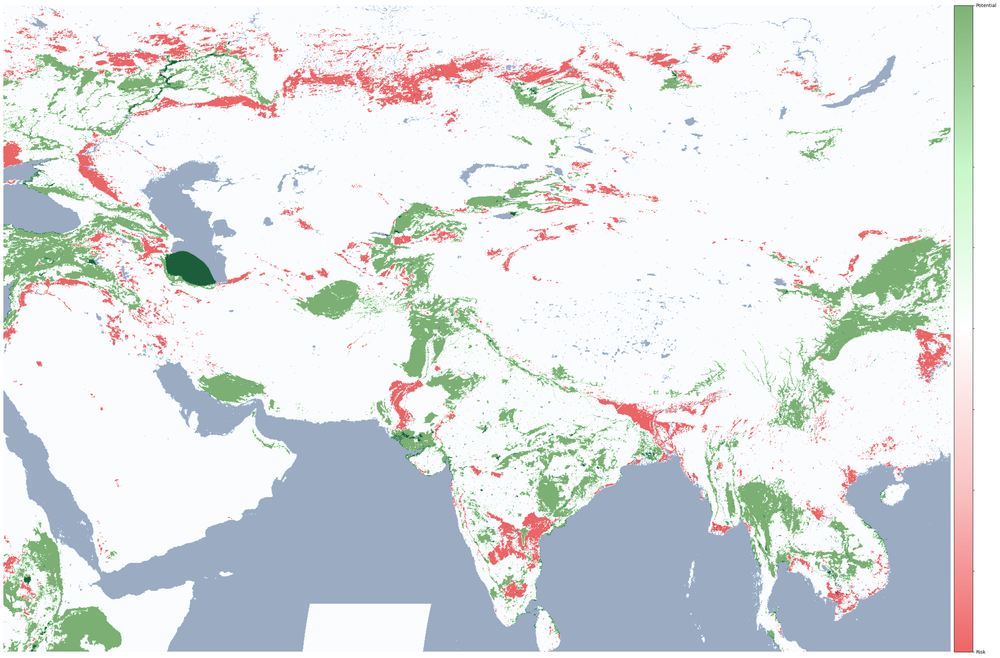

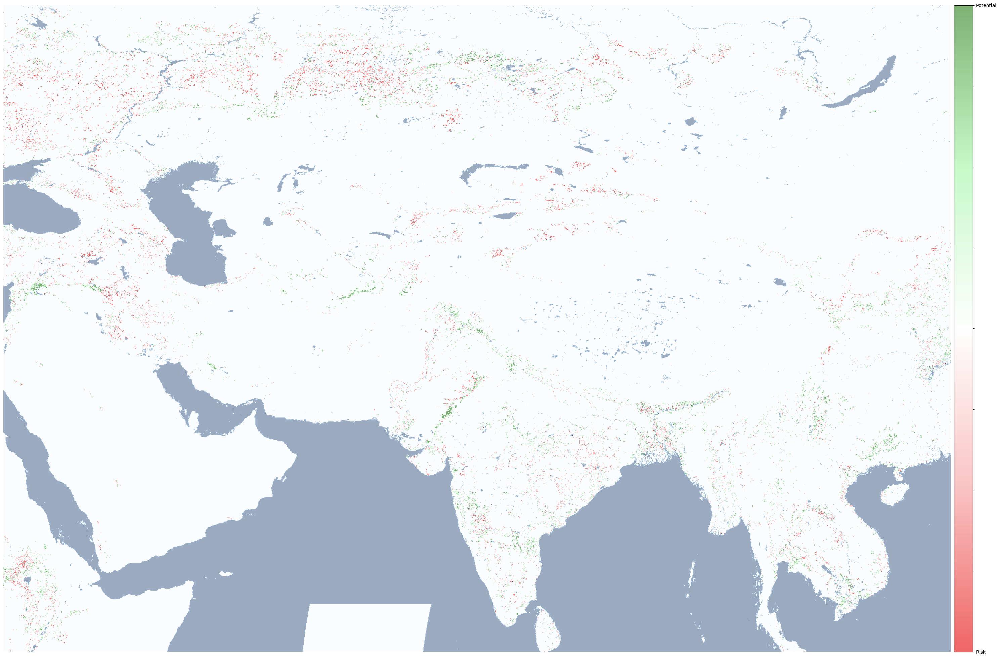

In [5]:
#Fit the XGBClassification model on the train data
from crop_classifier import classifier

params_xgbс = {
    'learning_rate': 0.02,
    'n_estimators': 200,
    'objective': 'binary:logistic',
    'nthread': -1,
    'max_depth': 5,
    'use_label_encoder':False,
    'reg_alpha': 0.1,
    'reg_lambda': 1
    } 

# Fit the climate model (or use the loaded one if it exists)
# Define set of features to use in model
set_climate = ['bio12', 'bio1', 'bio5', 'elv']
model_shell = classifier(model_climate_loaded)
model_climate = model_shell.model(**params_xgbс)
model_shell.collect_data(Climate_train, Climate_test, Elv, LC_feature_train, LC_feature_test, LC_train, LC_test, years_train, years_test, set_climate)
model_shell.fit_classifier()

# Save model (rewrites file only if rewrite == True)
model_shell.save("model_climate.pkl", rewrite = False)
model_climate_scores = model_shell.scores()
# Misclassified areas
plotting.plot_trend_global(path, model_shell, params_xgbс, model_shell.y_test, X = model_shell.X_test)

# Fit the climate_lc model (or use the loaded one if it exists)
# Define set of features to use in model
set_climate_lc = ['bio12', 'bio1', 'bio5', 'elv', 'lc']
model_shell = classifier(model_climate_lc_loaded)
model_climate_lc = model_shell.model(**params_xgbс)
model_shell.collect_data(Climate_train, Climate_test, Elv, LC_feature_train, LC_feature_test, LC_train, LC_test, years_train, years_test, set_climate_lc)
model_shell.fit_classifier()

# Save model (rewrites file only if rewrite == True)
model_shell.save("model_climate_lc.pkl", rewrite = False)
model_climate_lc_scores = model_shell.scores()
# Misclassified areas
plotting.plot_trend_global(path, model_shell, params_xgbс, model_shell.y_test, X = model_shell.X_test)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


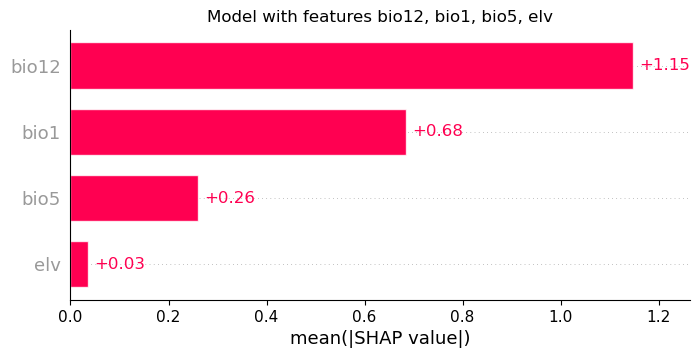

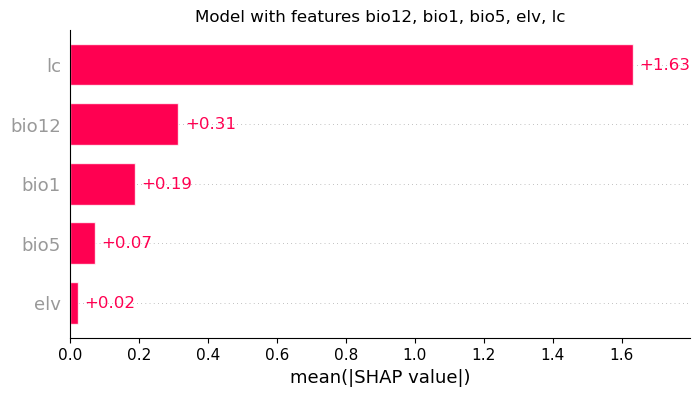

In [19]:
# Plot feature importances for the models (executes for 3 hours)
plotting.plot_shap(model_climate, Climate_train, Elv, LC_feature_train, LC_train, years_train, set_climate)
plotting.plot_shap(model_climate_lc, Climate_train, Elv, LC_feature_train, LC_train, years_train, set_climate_lc)

#### Calibration plot

In [49]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

from sklearn.calibration import CalibratedClassifierCV, CalibrationDisplay

gnb = model_climate_lc
gnb_isotonic = CalibratedClassifierCV(model_shell, cv=2, method="isotonic")
gnb_sigmoid = CalibratedClassifierCV(model_shell, cv=2, method="sigmoid")

clf_list = [

    (gnb, "XGBClassifier"),
    # (gnb_isotonic, "Naive Bayes + Isotonic"),
    # (gnb_sigmoid, "Naive Bayes + Sigmoid"),
]

In [ ]:
base = pickle.load(open(clf_dict[model], "rb"))
calib = CalibratedClassifierCV(base, method='isotonic',  cv="prefit")
y_proba = calib.fit(X_train, y_train).predict_proba(X_test)

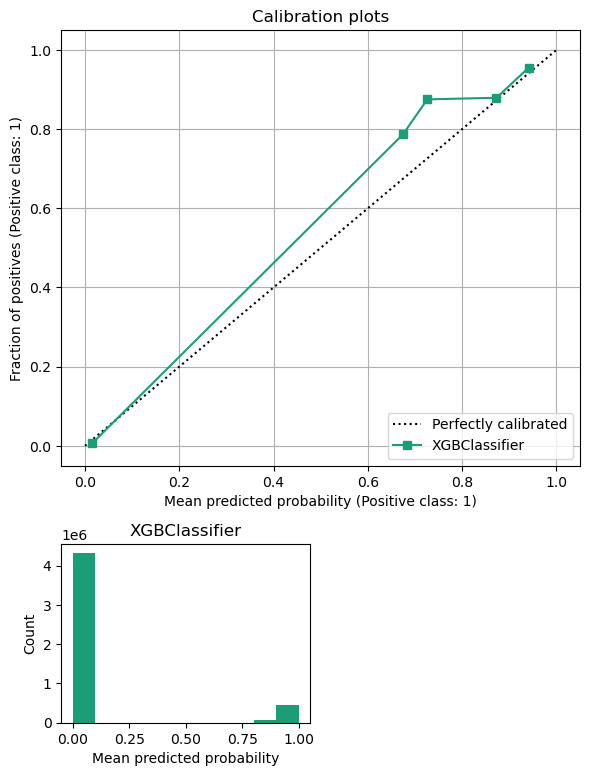

In [54]:
fig = plt.figure(figsize=(6, 10))
gs = GridSpec(4, 2)
colors = plt.cm.get_cmap("Dark2")

ax_calibration_curve = fig.add_subplot(gs[:2, :2])
calibration_displays = {}
for i, (clf, name) in enumerate(clf_list):
    clf.fit(model_shell.X_train, model_shell.y_train)
    display = CalibrationDisplay.from_estimator(
        clf,
        model_shell.X_test,
        model_shell.y_test,
        n_bins=10,
        name=name,
        ax=ax_calibration_curve,
        color=colors(i),
    )
    calibration_displays[name] = display

ax_calibration_curve.grid()
ax_calibration_curve.set_title("Calibration plots")

# Add histogram
grid_positions = [(2, 0), (2, 1), (3, 0), (3, 1)]
for i, (_, name) in enumerate(clf_list):
    row, col = grid_positions[i]
    ax = fig.add_subplot(gs[row, col])

    ax.hist(
        calibration_displays[name].y_prob,
        range=(0, 1),
        bins=10,
        label=name,
        color=colors(i),
    )
    ax.set(title=name, xlabel="Mean predicted probability", ylabel="Count")

plt.tight_layout()
plt.show()

## See the changes on country level

FixedFormatter should only be used together with FixedLocator


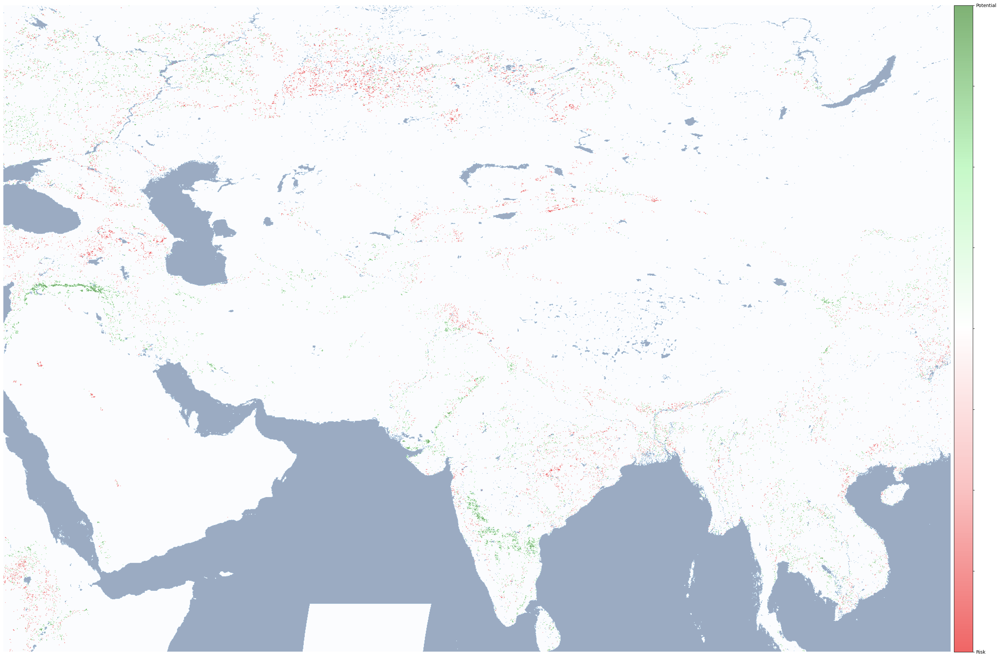

In [8]:
# Compare prediction and baseline (i.e. test data), see the difference
proba_future, y_test = utils.avg_future_pred(Climate_future, years_future, LC_feature_future, Elv, LC_test, model_climate_lc, set_climate_lc)
plotting.plot_trend_global(path, model_shell, params_xgbс, model_shell.y_test, proba = proba_future)

In [10]:
Climate_future

{'CNRM-CM5': {'bio1': array([0., 0., 0., ..., 0., 0., 0.]),
  'bio2': array([[[ 0.        ],
          [ 0.        ],
          [ 0.        ],
          ...,
          [80.46066538],
          [80.46066538],
          [80.50352478]],
  
         [[ 0.        ],
          [ 0.        ],
          [ 0.        ],
          ...,
          [78.55010668],
          [78.55010668],
          [77.77976354]],
  
         [[ 0.        ],
          [ 0.        ],
          [ 0.        ],
          ...,
          [78.55010668],
          [78.55010668],
          [77.77976354]],
  
         ...,
  
         [[ 0.        ],
          [ 0.        ],
          [ 0.        ],
          ...,
          [ 0.        ],
          [ 0.        ],
          [ 0.        ]],
  
         [[ 0.        ],
          [ 0.        ],
          [ 0.        ],
          ...,
          [ 0.        ],
          [ 0.        ],
          [ 0.        ]],
  
         [[ 0.        ],
          [ 0.        ],
          [ 0.      

In [ ]:
# Save all changes to raster
utils.changes2raster (model_climate, 'model_climate', set_climate, Elv, LC_feature_future, Climate_future, LC_test, 
                      years_test, year_start_future+lag, path, path_pics, model_climate_scores['threshold'])
utils.changes2raster (model_climate_lc, 'model_climate_lc', set_climate_lc, Elv, LC_feature_future, Climate_future, LC_test,
                      years_test, year_start_future+lag, path, path_pics, model_climate_lc_scores['threshold'])

In [28]:
# Define countries and their prefixes
country_names = ['Azerbaijan', 'Cambodia',   'Japan',
                'Kazakhstan', 'Kyrgyzstan', 'Myanmar', 
                'Philippines', 'Korea', 'Turkey', 
                'Thailand', 'Uzbekistan', 'Viet Nam']
prefixes = [ 'AZE', 'KHM',  'JPN',
            'KAZ', 'KGZ', 'MMR',
            'PHL', 'KOR', 'TUR',
            'THA', 'UZB', 'VNM']

# Create cropped tiffs for every country in the list
utils.crop_country ('model_climate', prefixes, country_names, path, path_pics, year_start_future+lag)
utils.crop_country ('model_climate_lc', prefixes, country_names, path, path_pics, year_start_future+lag)

Azerbaijan


FixedFormatter should only be used together with FixedLocator


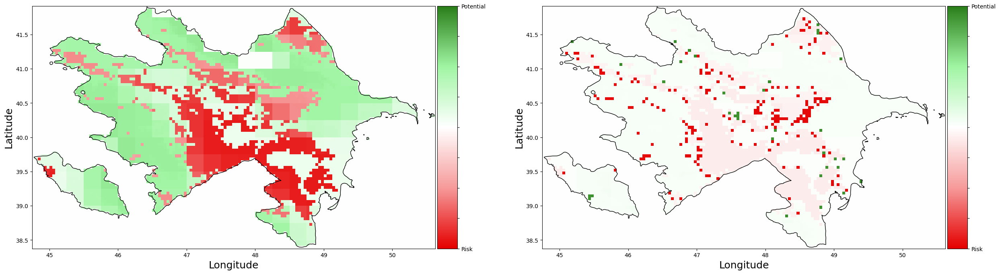

Cambodia


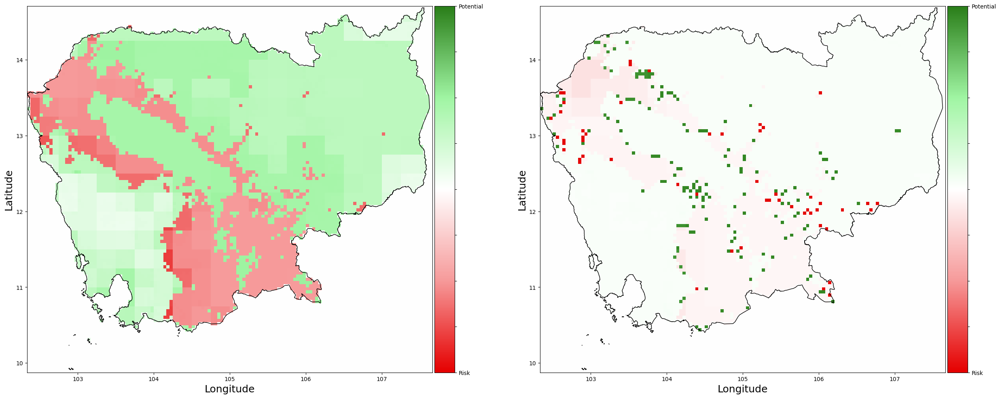

Japan


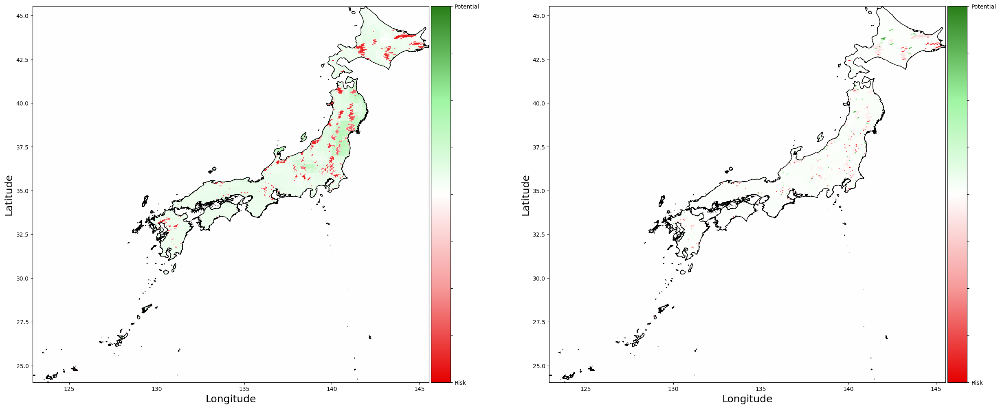

Kazakhstan


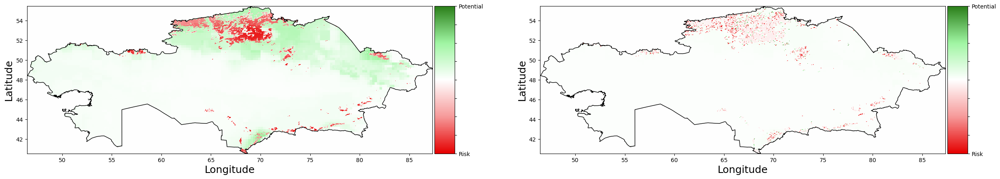

Kyrgyzstan


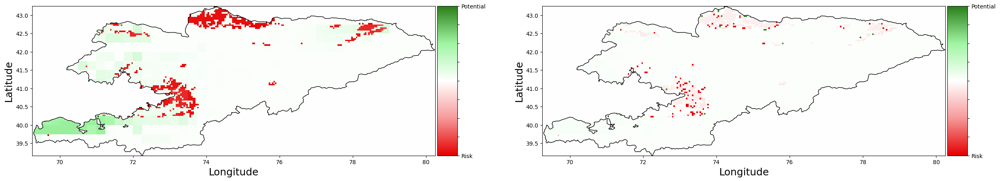

Myanmar


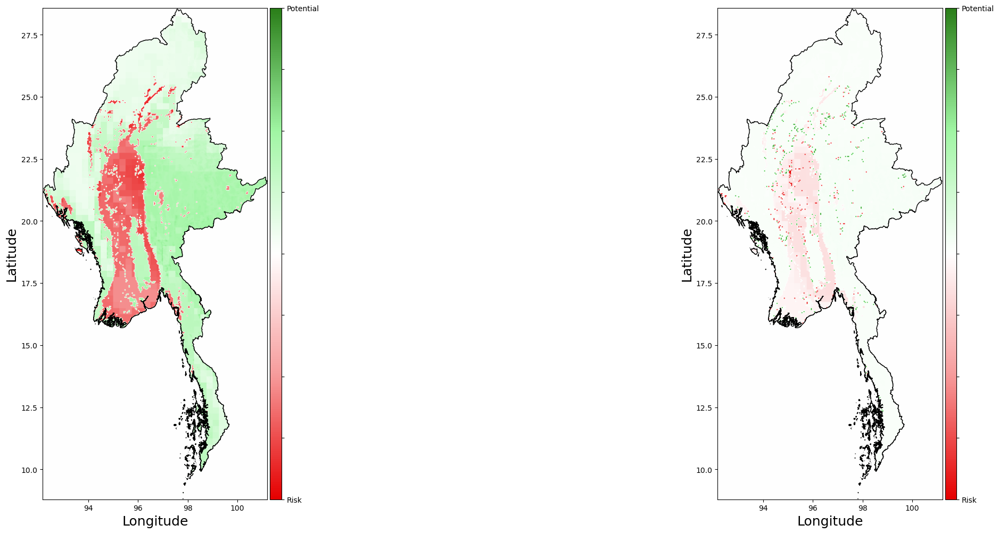

Philippines


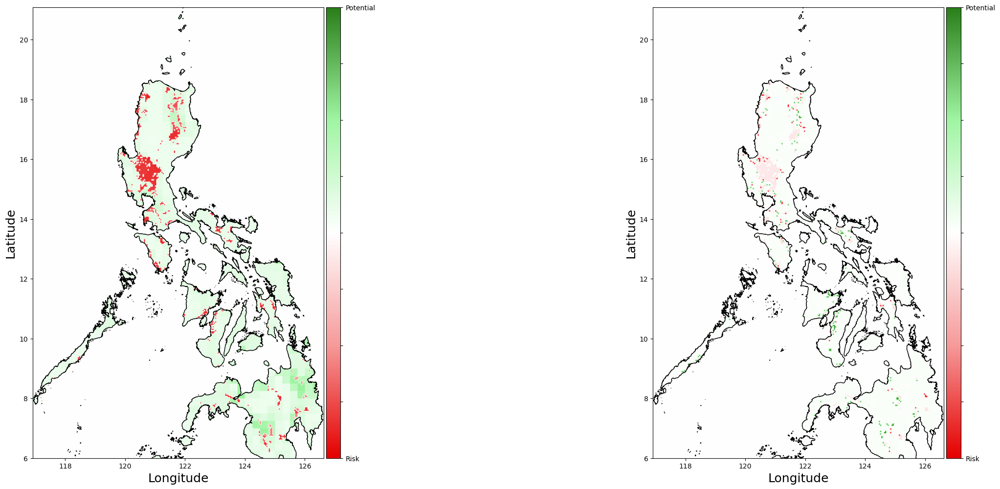

Korea


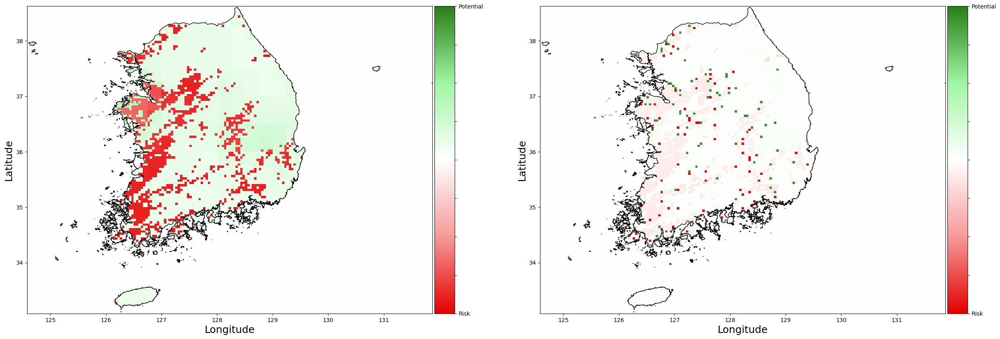

Turkey


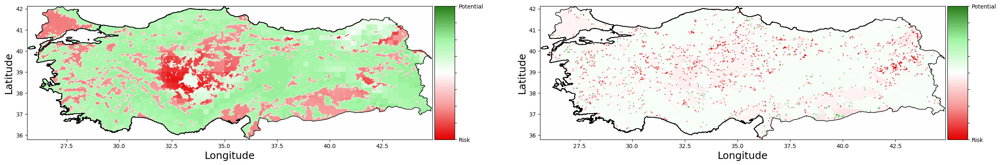

Thailand


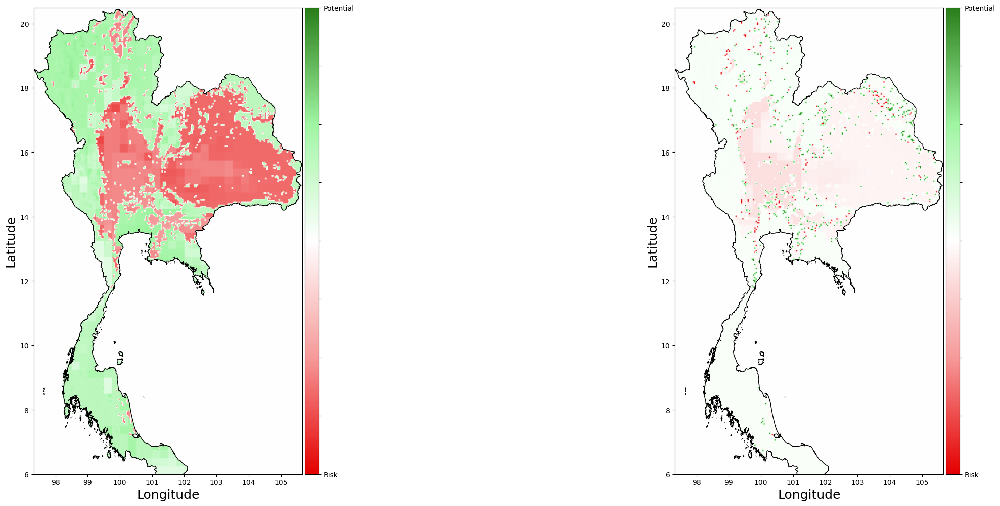

Uzbekistan


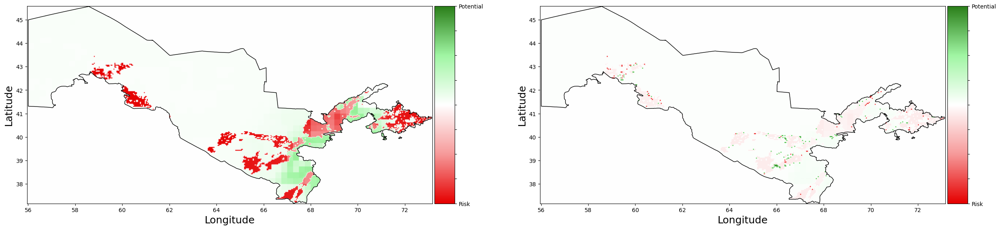

Viet Nam


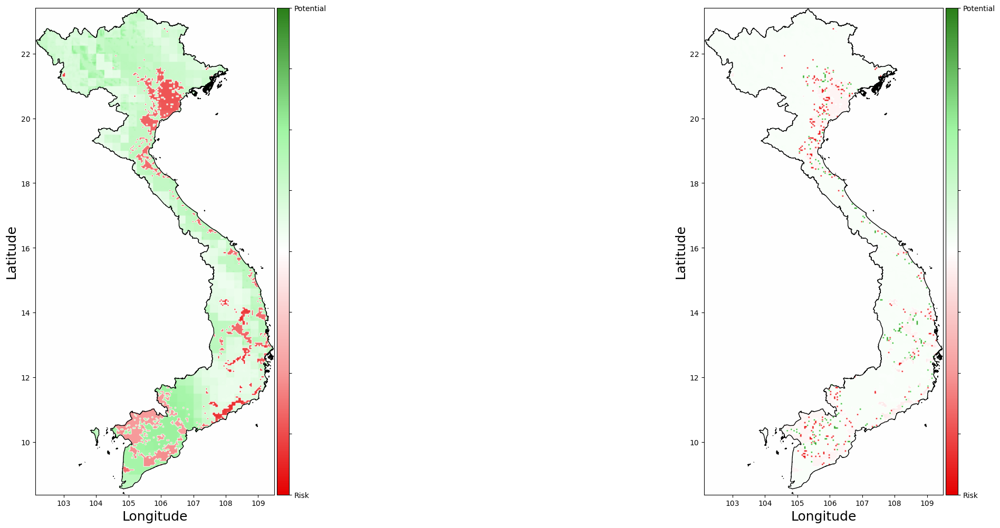

In [29]:
# Plot changes to be expected in future comparing with test year
positive, negative = plotting.plot_trend('model_climate', 'model_climate_lc', prefixes, country_names, year_start_future+lag, path, path_pics)

In [30]:
# Save crop changes expectations in separate file
json.dump(negative, open("crops_disappear_{}_{}.txt".format(year_start_test, year_start_future+lag),'w'))
negative

{'AZE': 13.2,
 'KHM': 2.3,
 'JPN': 10.4,
 'KAZ': 16.4,
 'KGZ': 11.8,
 'MMR': 3.2,
 'PHL': 7.4,
 'KOR': 6.5,
 'TUR': 9.7,
 'THA': 1.9,
 'UZB': 2.4,
 'VNM': 11.9}